# US Corn Belt Crop Classifier: Data Exploration

The purpose of this project is to develop a crop type classification system for the Corn Belt region of the US. As a pilot version of the project, we evaluate classification methods for the state of Illinois. In this notebook, we conduct a range of analyses to evaluate the separability of the crop type classes in order to inform our choice of methods and experiments.

## 1. Import required packages

In [1]:
# Standard libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

# Geospatial libraries
import geopandas as gpd
import rasterio
from rasterio.plot import show, show_hist
from rasterio.mask import mask
from osgeo import gdal
from fiona.crs import from_epsg
from shapely.geometry import box

# ML libraries
from sklearn.decomposition import PCA

# System libraries
import os
import time
from glob import glob

## 2. Get some HLS data

The Harmonized Landsat and Sentinel-2 (HLS) dataset processes Landsat OLI and Sentinel-2 images into a common grid and wavelengths such that images from the two sensors can essentially be treated as images from a single sensor. Images are 30 m/px and re-sampled to Landsat OLI wavelengths.

In [2]:
# Define the root directory for the dataset
fp_illinois = '/gpfs/data1/cmongp1/GEOGLAM/Input/field_data/hls/tif'

### Load a relatively cloud-free Landsat image in growing season

The Landsat-8 bands we want to use are:
* blue
* green
* red
* swir1 (1600 nm)
* swir2 (2100 nm ish)

Plus band ratios:
* NDVI
* GCVI

In [92]:
# Define the path template for the image
l30_path = '%s/16SCJ/L30/2018/HLS.L30.T16SCJ.2018213.v1.4_%s.tif'

# Create an np.array to hold the 7 band image (all tiles are 3660 x 3660)
l30_img = np.ndarray([3660, 3660, 7])

# Load each band into the array
for i, band in enumerate(['blue', 'green', 'red', 'swir1', 'swir2', 'ndvi', 'gcvi']):
    l30_fp = os.path.join(fp_illinois, l30_path % (band, band))
    l30_raster = rasterio.open(l30_fp)
    l30_img[:,:,i] = l30_raster.read(1)
    
print l30_raster.meta

{'count': 1, 'crs': CRS.from_epsg(32616), 'dtype': 'float32', 'driver': u'GTiff', 'transform': Affine(30.0, 0.0, 300000.0,
       0.0, -30.0, 4400040.0), 'height': 3660, 'width': 3660, 'nodata': nan}


In [63]:
# Calculate fraction of no-data pixels
nodata = np.where(np.isnan(l30_img))
print("Fraction of pixels that are NaN: %f" % ((len(nodata[0])/7.)/(l30_raster.width*l30_raster.height)))
# Mask out the NaN pixels
l30_img = np.ma.masked_where(np.isnan(l30_img), l30_img)

Fraction of pixels that are NaN: 0.249295


Text(0.5,1,'Landsat-8 subframe T16SCJ, 8/1/2019, RGB')

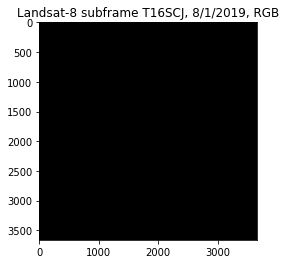

In [64]:
# Select R,G,B bands - must be a better way to stretch the image...
img = l30_img
l30_combined = np.zeros([img.shape[0], img.shape[0], 3])
l30_combined[:,:,0] = np.clip(np.interp(img[:,:,2], (img[:,:,2].min(), img[:,:,2].max()), (0,1)), 0, 0.2)  # red
l30_combined[:,:,1] = np.clip(np.interp(img[:,:,1], (img[:,:,1].min(), img[:,:,1].max()), (0,1)), 0, 0.2)  # green
l30_combined[:,:,2] = np.clip(np.interp(img[:,:,0], (img[:,:,0].min(), img[:,:,0].max()), (0,1)), 0, 0.2) # blue

l30_combined = np.interp(l30_combined, (l30_combined.min(), l30_combined.max()), (0,1))

# Plot image
plt.imshow(l30_combined)
plt.title('Landsat-8 subframe T16SCJ, 8/1/2019, RGB')

This is a lot of pixels and its hard to see the actual crop fields, so we'll subset this to a smaller (400x400) region for the purposes of visualization and this analysis.

Text(0.5,1,'Landsat-8 subframe T16SCJ, 8/1/2019, RGB')

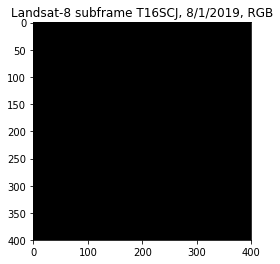

In [65]:
# Select R,G,B bands - must be a better way to stretch the image...
img = l30_img[:400,:400]
l30_combined = np.zeros([img.shape[0], img.shape[0], 3])
l30_combined[:,:,0] = np.clip(np.interp(img[:,:,2], (img[:,:,2].min(), img[:,:,2].max()), (0,1)), 0, 0.2)  # red
l30_combined[:,:,1] = np.clip(np.interp(img[:,:,1], (img[:,:,1].min(), img[:,:,1].max()), (0,1)), 0, 0.2)  # green
l30_combined[:,:,2] = np.clip(np.interp(img[:,:,0], (img[:,:,0].min(), img[:,:,0].max()), (0,1)), 0, 0.2) # blue

l30_combined = np.interp(l30_combined, (l30_combined.min(), l30_combined.max()), (0,1))

# Plot image
plt.imshow(l30_combined)
plt.title('Landsat-8 subframe T16SCJ, 8/1/2019, RGB')

Text(0.5,1,'Landsat-8 subframe T16SCJ, 8/1/2019, NDVI (green) + SWIR1 (red/blue)')

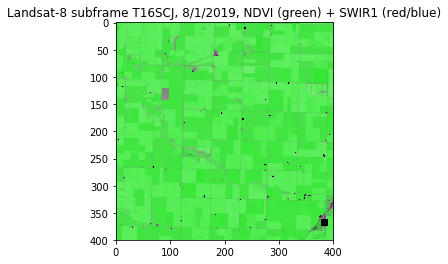

In [66]:
# Select NDVI and SWIR1 bands
img = l30_img[:400,:400]
l30_combined = np.zeros([img.shape[0], img.shape[0], 3])
l30_combined[:,:,0] = np.interp(img[:,:,3], (img[:,:,3].min(), img[:,:,3].max()), (0,1))  # red
l30_combined[:,:,1] = np.interp(img[:,:,5], (img[:,:,5].min(), img[:,:,5].max()), (0,1))  # green
l30_combined[:,:,2] = l30_combined[:,:,0]  # blue + red = purple

# Plot image
plt.imshow(l30_combined)
plt.title('Landsat-8 subframe T16SCJ, 8/1/2019, NDVI (green) + SWIR1 (red/blue)')

### Load a relatively cloud-free Sentinel-2 image in growing season

The Sentinel-2 bands that align with the Landsat-8 bands are:
* blue
* green
* red
* swir1 (1600 nm)
* swir2 (2100 nm ish)

Plus band ratios:
* NDVI
* GCVI


In [83]:
# Define the path template for the image
s30_path = '%s/16SCJ/S30/2018/HLS.S30.T16SCJ.2018186.v1.4_%s.tif'

# Create an np.array to hold the 7 band image (all tiles are 3660 x 3660)
s30_img = np.ndarray([3660, 3660, 7])

# Load each band into the array
for i, band in enumerate(['blue', 'green', 'red', 'swir1', 'swir2', 'ndvi', 'gcvi']):
    s30_fp = os.path.join(fp_illinois, s30_path % (band, band))
    s30_raster = rasterio.open(s30_fp)
    s30_img[:,:,i] = s30_raster.read(1)

In [9]:
# Calculate fraction of no-data pixels
nodata = np.where(np.isnan(s30_img))
print("Fraction of pixels that are NaN: %f" % ((len(nodata[0])/7.)/(s30_raster.width*s30_raster.height)))
# Mask out the NaN pixels
s30_img = np.ma.masked_where(np.isnan(s30_img), s30_img)

Fraction of pixels that are NaN: 0.091926


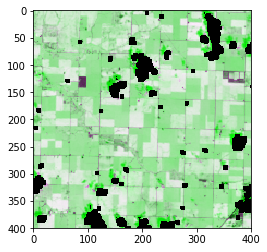

In [10]:
# Select NDVI and SWIR1 bands
img = s30_img[:400,:400]
s30_combined = np.zeros([img.shape[0], img.shape[0], 3])
s30_combined[:,:,0] = np.interp(img[:,:,3], (img[:,:,3].min(), img[:,:,3].max()), (0,1))  # red
s30_combined[:,:,1] = np.interp(img[:,:,5], (img[:,:,5].min(), img[:,:,5].max()), (0,1))  # green
s30_combined[:,:,2] = s30_combined[:,:,0]  # blue + red = purple

# Plot image
plt.imshow(s30_combined)

## 2. Investigate separability

Before designing our ML methods and experiments, we first want to investigate the separability of the crop type classes through visualization. To do this, we need to get the crop type labels associated with the image we are working with.

### Get crop type labels

The Cropland Data Layer (CDL) provides crop type/land cover classes at 30 m/px resolution for the US each year. It is created by the USDA NASS and is released to the public a few months after the end of the growing season (i.e., the following year). The CDL provides 3 bands: 

* Band 1: 254 land cover classes including >100 crop types
* Band 2: binary land cover class of cultivated/non-cultivated
* Band 3: confidence in the predicted class (0-100, 100 being most confident) - can't figure out how to get this from CropScape

In [11]:
# Load CDL layer for 2018 in Illinois
fp = '/gpfs/data1/cmongp1/hkerner/us-corn/data/CDL_2018_illinois.tif'
cdl_2018 = rasterio.open(fp)
crop_types = cdl_2018.read(1)
print cdl_2018.meta

{'count': 1, 'crs': CRS.from_epsg(32616), 'dtype': 'uint8', 'driver': u'GTiff', 'transform': Affine(30.0, 0.0, 115575.0,
       0.0, -30.0, 4712655.0), 'height': 20630, 'width': 11381, 'nodata': None}


This CDL GeoTIFF is for the entire state of Illinois. We want to clip it to the area we are looking at in our example L30 and S30 images (MGRS tile 16SCJ). 

In [12]:
# Insert the bounds of the L30 image into a GeoDataFrame
b = list(l30_raster.bounds)
bbox = box(b[0], b[1], b[2], b[3]) # there must be a better way to do this
# Note: not re-projecting into the same CRS because they are already the same (32616)

crop_types_subset = mask(dataset=cdl_2018, shapes=[bbox], crop=True)
cdl_labels = crop_types_subset[0][0]
cdl_labels.shape # this is one pixel larger in each dimension..??? need to fix

(3661, 3661)

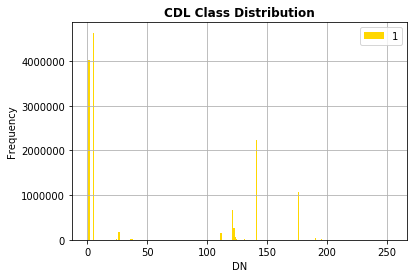

In [13]:
# Plot a histogram showing class frequency for all classes in our tile
show_hist(cdl_labels, bins=254, title='CDL Class Distribution')

For now, we only want to look at corn, soybeans, and everything else grouped as a single category.

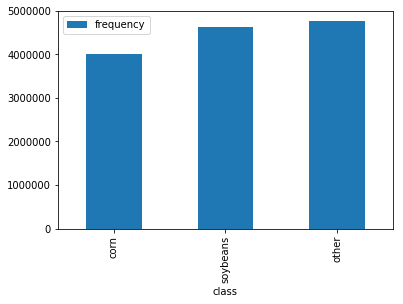

In [14]:
# Plot the frequency of only corn, soybeans, and everything else
labels_flat = cdl_labels.flatten()
df = pd.DataFrame()
df['class'] = None
df['frequency'] = None
n_corn = len(np.where(labels_flat==1)[0])
n_soybean = len(np.where(labels_flat==5)[0])
df.loc[0] = ['corn', n_corn]
df.loc[1] = ['soybeans', n_soybean]
# df.loc[2] = ['grassland/pasture', len(np.where(labels_flat==176)[0])]
# df.loc[3] = ['deciduous_forest', len(np.where(labels_flat==141)[0])]
df.loc[4] = ['other', labels_flat.shape[0] - n_corn - n_soybean]

df.plot.bar(x='class')

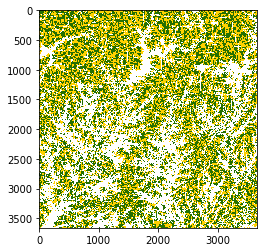

In [15]:
# Display the CDL labels for corn and soybeans only
# Create a 3-channel array to hold the label image
cdl_img = np.ndarray([cdl_labels.shape[0], cdl_labels.shape[1], 4])
# Get the pixels where corn and soybeans are labeled
corn_inds = np.where(cdl_labels==1)
soybean_inds = np.where(cdl_labels==5)
cdl_img[corn_inds[0], corn_inds[1]] = [1, 0.82, 0, 1.0]
cdl_img[soybean_inds[0], soybean_inds[1]] = [0.149, 0.439, 0, 1.0]
plt.imshow(cdl_img)

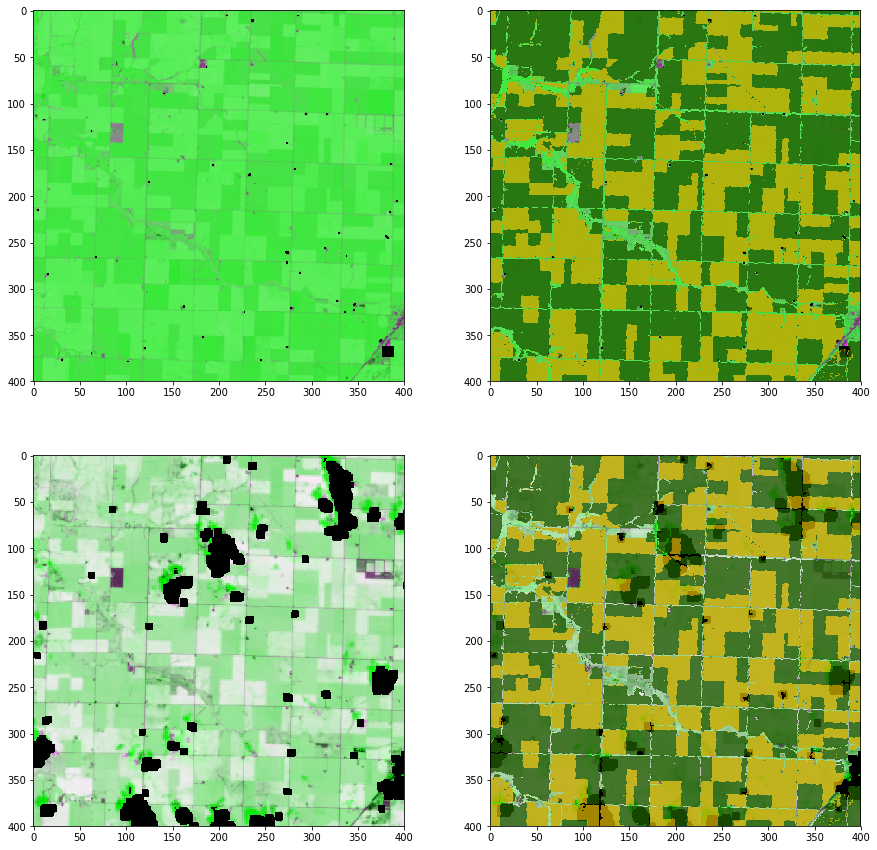

In [16]:
# Display the CDL labels on top of the Landsat and Sentinel-2 images
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=[15,15])
# Display the Landsat image
axes[0,0].imshow(l30_combined)
axes[0,1].imshow(l30_combined)
axes[0,1].imshow(cdl_img[:400, :400]*0.8)
# Display the Sentinel-2 image
axes[1,0].imshow(s30_combined)
axes[1,1].imshow(s30_combined)
axes[1,1].imshow(cdl_img[:400, :400]*0.8)

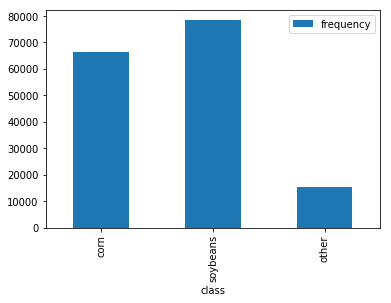

In [17]:
# Plot the class distribution for the 400x400 subset of the image too
labels_flat = cdl_labels[:400,:400].flatten()
df = pd.DataFrame()
df['class'] = None
df['frequency'] = None
n_corn = len(np.where(labels_flat==1)[0])
n_soybean = len(np.where(labels_flat==5)[0])
df.loc[0] = ['corn', n_corn]
df.loc[1] = ['soybeans', n_soybean]
# df.loc[2] = ['grassland/pasture', len(np.where(labels_flat==176)[0])]
# df.loc[3] = ['deciduous_forest', len(np.where(labels_flat==141)[0])]
df.loc[4] = ['other', labels_flat.shape[0] - n_corn - n_soybean]

df.plot.bar(x='class')

Compared to the distribution of corn, soybeans, and other across the entire tile, the distribution in our 400x400-pixel subset area has far fewer 'other' pixels but approximately the same relative number of corn and soybean pixels.

### NDVI vs. SWIR1

We've seen in prior work by GLAD (e.g., King et al., 2017) that the spectra of corn and soybeans in the midwest can be clearly separated using the SWIR1 (1600 nm) reflectance and "seasonal slope of NDVI". It is not clear how exactly seasonal slope of NDVI is calculated, and in any case this would require the time-series data which is not yet ready (still downloading, evaluating no-data filtering, etc.).

As a start, we can plot NDVI vs. SWIR1 for our example images.

Text(0.5,1,'Landsat-8 NDVI vs. SWIR1, central Illinois (16SCJ), 8/1/2018')

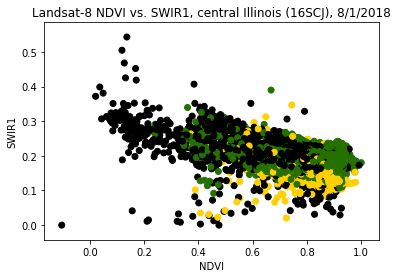

In [18]:
# Plot NDVI vs. SWIR - Landsat
plt.scatter(l30_img[:400, :400, 5].flatten(), l30_img[:400, :400, 3].flatten(), c=np.reshape(cdl_img[:400,:400,:3].flatten(), [400*400,3]))
plt.xlabel('NDVI')
plt.ylabel('SWIR1')
plt.title('Landsat-8 NDVI vs. SWIR1, central Illinois (16SCJ), 8/1/2018')

Text(0.5,1,'Sentinel-2 NDVI vs. SWIR1, central Illinois (16SCJ), 7/5/2018')

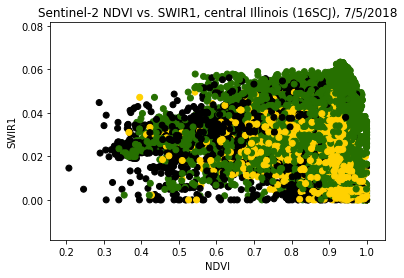

In [19]:
# Plot NDVI vs. SWIR - Sentinel-2
plt.scatter(s30_img[:400, :400, 5].flatten(), s30_img[:400, :400, 3].flatten(), c=np.reshape(cdl_img[:400,:400,:3].flatten(), [400*400,3]))
plt.xlabel('NDVI')
plt.ylabel('SWIR1')
plt.title('Sentinel-2 NDVI vs. SWIR1, central Illinois (16SCJ), 7/5/2018')

In the plots above, yellow is corn, green is soybeans, and black is everything else. These classes are not linearly separable using NDVI and SWIR1 as the only features. We will need to see if incorporating the time-series for NDVI via the seasonal slope of NDVI will make these classes more linearly separable.

Important note: we are only looking at one ~12x12 km subset of the data here. It's possible that this could look different over a larger or randomly-sampled area.

### All band combinations

To see which bands might help separate the crop type classes, let's plot every combination of band reflectances for all the pixels in our example dataset.

In [20]:
bands = ['blue', 'green', 'red', 'swir1', 'swir2', 'ndvi', 'gcvi']

Text(0.5,0.98,'Sentinel-2 Band Combinations')

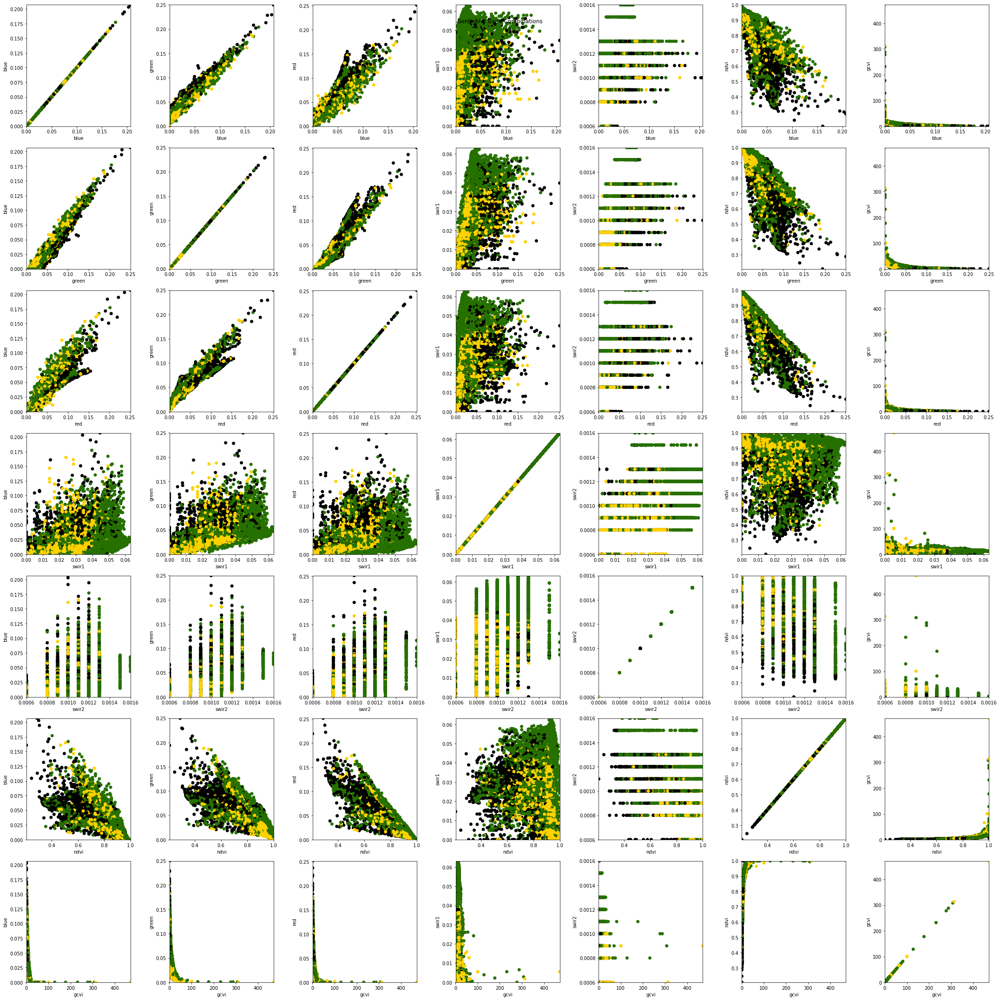

In [33]:
fig, ax = plt.subplots(nrows=7, ncols=7, figsize=[30,30])
for i in range(7):
    for j in range(7):
        ax[i,j].scatter(s30_img[:400, :400, i].flatten(), s30_img[:400, :400, j].flatten(), c=np.reshape(cdl_img[:400,:400,:3].flatten(), [400*400,3]))
        ax[i,j].set_xlabel(bands[i])
        ax[i,j].set_ylabel(bands[j])
        ax[i,j].set_xlim(s30_img[:400, :400, i].min(), s30_img[:400, :400, i].max())
        ax[i,j].set_ylim(s30_img[:400, :400, j].min(), s30_img[:400, :400, j].max())

fig.tight_layout()
fig.suptitle("Sentinel-2 Band Combinations")

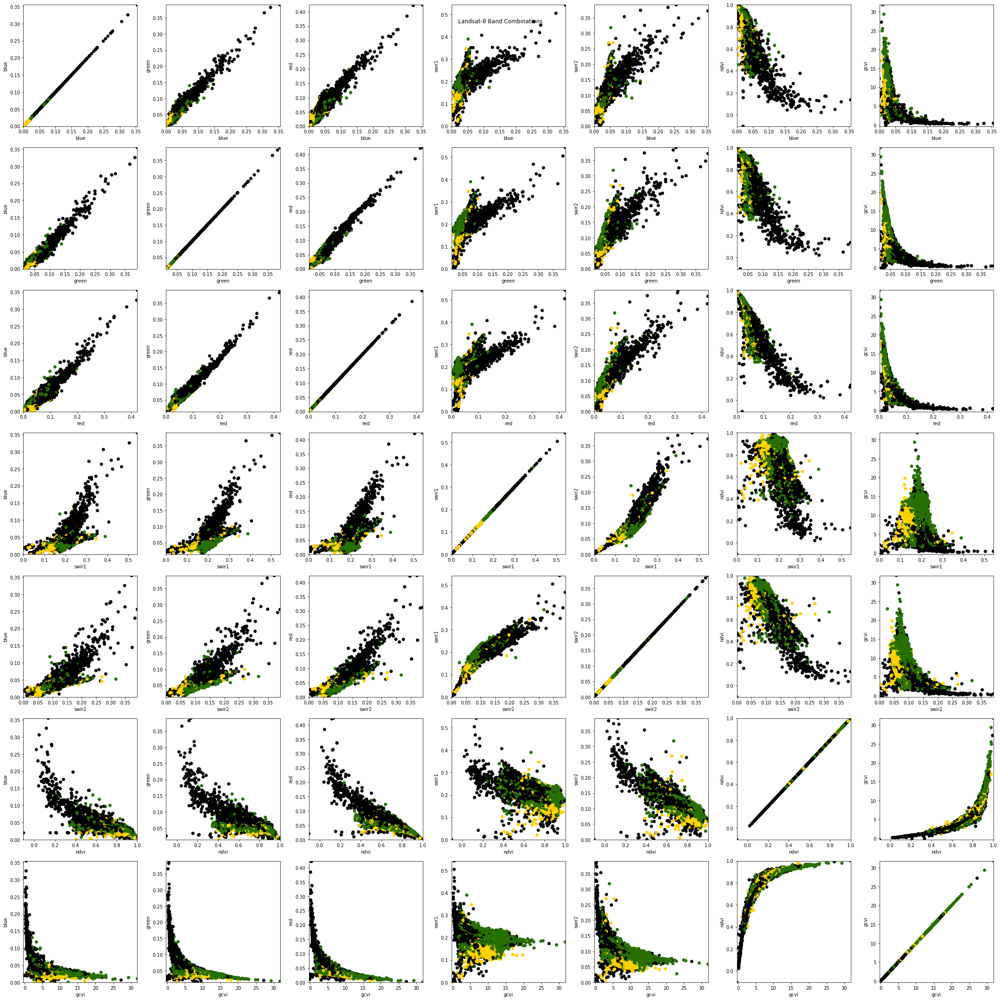

In [34]:

fig, ax = plt.subplots(nrows=7, ncols=7, figsize=[30,30])
for i in range(7):
    for j in range(7):
        ax[i,j].scatter(l30_img[:400, :400, i].flatten(), l30_img[:400, :400, j].flatten(), c=np.reshape(cdl_img[:400,:400,:3].flatten(), [400*400,3]))
        ax[i,j].set_xlabel(bands[i])
        ax[i,j].set_ylabel(bands[j])
        ax[i,j].set_xlim(l30_img[:400, :400, i].min(), l30_img[:400, :400, i].max())
        ax[i,j].set_ylim(l30_img[:400, :400, j].min(), l30_img[:400, :400, j].max())
fig.suptitle("Landsat-8 Band Combinations")
fig.tight_layout()


### Dimensionality reduction via PCA

Another way to evaluate the linear separability of the spectra is to use PCA to compute latent variables that have maximal variability across all spectra in the dataset. Since we can't compute the SVD for PCA with NaNs in our data matrix, we need to take out all the pixels that contain no data before we apply PCA.

In [87]:
# Reshape the 3D multispectral image into a 2D matrix of spectra in each row
l30_spectra = np.reshape(l30_img[:400,:400], [400*400, 7])
s30_spectra = np.reshape(s30_img[:400,:400], [400*400, 7])

# Delete the no-data pixels 
l30_spectra = np.delete(l30_spectra, np.where(np.isnan(l30_spectra))[0], axis=0)
s30_spectra = np.delete(s30_spectra, np.where(np.isnan(s30_spectra))[0], axis=0)

# Subtract the mean to center the data 
l30_spectra -= np.mean(l30_spectra, axis=0)
s30_spectra -= np.mean(s30_spectra, axis=0)

# Apply PCA with 2 components to the data
# (Only using 2 components right now to visualize in 2D)
pca = PCA(n_components=2)
l30_pca = pca.fit_transform(l30_spectra)

pca2 = PCA(n_components=2)
s30_pca = pca2.fit_transform(s30_spectra)

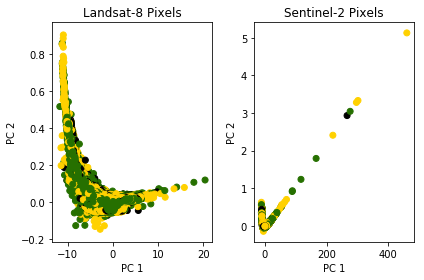

In [89]:
# Plot the data in the principal subspace colored by class
fig, axes = plt.subplots(ncols=2)
axes[0].scatter(l30_pca[:,0], l30_pca[:,1], c=np.reshape(cdl_img[:400,:400,:3].flatten(), [400*400,3]))
axes[1].scatter(s30_pca[:,0], s30_pca[:,1], c=np.reshape(cdl_img[:400,:400,:3].flatten(), [400*400,3]))

# Set axes labels
axes[0].set_xlabel("PC 1")
axes[0].set_ylabel("PC 2")
axes[0].set_title("Landsat-8 Pixels")
axes[1].set_xlabel("PC 1")
axes[1].set_ylabel("PC 2")
axes[1].set_title("Sentinel-2 Pixels")

fig.tight_layout()

This shows that PCA is not sufficient to compute latent features that make these three classes linearly separable. Non-linear methods may be more promising!

## 2b. Investigate separability with time-series

The above visualizations show that crop types in our study area are not linearly separable using only the reflectance spectra or vegetation indices for a single image. Next, we want to investigate if the crop classes are linearly separable using the time series of reflectances in each band, or the "time spectra".

### Load the Landsat time-series 
First, we'll load all the L30 observations we have for each band separately for just our example MGRS tile (16SCJ). 

In [93]:
# Path to the 2018 observations for 16SCJ
l30_path = '%s/16SCJ/L30/2018'

# Get the number of observations for that year
n_l30 = len(os.listdir(os.path.join(fp_illinois, l30_path % 'ndvi')))

# Get a list of the days of the year of each observation
l30_doys = []
for name in sorted(os.listdir(os.path.join(fp_illinois, l30_path % 'ndvi'))):
    l30_doys.append(int(name.split('.')[3][4:]))
    
print l30_doys

# Create a dictionary to hold time series cube for each band
l30_tseries_by_band = {}

# Iterate through each band directory
for b, band in enumerate(bands):
    if band in l30_tseries_by_band.keys():
        continue
    # Create an np.array to hold the t-band time-series (all tiles are 3660 x 3660)
    l30_tseries = np.ndarray([3660, 3660, n_l30])
    # Iterate through each observation
    for i, obs in enumerate(sorted(os.listdir(os.path.join(fp_illinois, l30_path % band)))):
        # Read/open the raster file
        obs_r = rasterio.open(os.path.join(fp_illinois, l30_path % band, obs))
        # Add this observation to the time series cube
        l30_tseries[:,:,i] = obs_r.read(1)
    l30_tseries_by_band[band] = l30_tseries
    
print l30_tseries_by_band.keys()

[5, 14, 21, 30, 37, 46, 53, 62, 69, 78, 85, 94, 101, 110, 117, 126, 133, 142, 149, 158, 165, 174, 181, 190, 197, 206, 213, 222, 229, 238, 245, 254, 261, 270, 277, 286, 293, 302, 309, 318, 325, 334, 341, 350, 357]
['blue', 'swir1', 'swir2', 'gcvi', 'green', 'ndvi', 'red']


In [22]:
print l30_tseries_by_band['ndvi'].shape

(3660, 3660, 45)


### Seasonal slope of NDVI vs. SWIR1

To plot the seasonal slope of NDVI vs. SWIR1 to see if these features make the crop types linearly separable, we first need to calculate the slope of the NDVI values for each pixel in the image over time.

To start, we'll plot the NDVI over time for a corn and soybean example from our Landsat image.

5
1
176
[0.00020007 0.14962193]


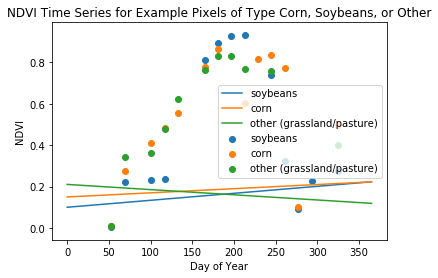

In [25]:
print cdl_labels[290,50]
print cdl_labels[25,100]
print cdl_labels[350,66]

nodata_inds = np.where(np.isnan(l30_tseries_by_band['ndvi']))
l30_tseries_by_band['ndvi'][nodata_inds] = 0

# Plot scatter - but I want these to be lines :(
plt.scatter(l30_doys, np.ma.masked_equal(l30_tseries_by_band['ndvi'][290,50], 0), label='soybeans')
plt.scatter(l30_doys, np.ma.masked_equal(l30_tseries_by_band['ndvi'][25,100], 0), label='corn')
plt.scatter(l30_doys, np.ma.masked_equal(l30_tseries_by_band['ndvi'][350,66], 0), label='other (grassland/pasture)')

# Plot linear regression lines
x = np.arange(0, 366)

fit_sbean = np.polyfit(l30_doys[5:-5], np.ma.masked_equal(l30_tseries_by_band['ndvi'][290,50,5:-5], 0), deg=1)
plt.plot(x, fit_sbean[0]*x + fit_sbean[1], label='soybeans')

fit_corn = np.polyfit(l30_doys[5:-5], np.ma.masked_equal(l30_tseries_by_band['ndvi'][25,100,5:-5], 0), deg=1)
plt.plot(x, fit_corn[0]*x + fit_corn[1], label='corn')
                                
fit_other = np.polyfit(l30_doys[5:-5], np.ma.masked_equal(l30_tseries_by_band['ndvi'][350,66,5:-5], 0), deg=1)
plt.plot(x, fit_other[0]*x + fit_other[1], label='other (grassland/pasture)')
                                
plt.xlabel("Day of Year")
plt.ylabel("NDVI")
plt.title("NDVI Time Series for Example Pixels of Type Corn, Soybeans, or Other")
plt.legend()

print fit_corn

# Is there another DOY range we should use when calculating 'seasonal slope'?

Seems like it could be promising, at least to separate out the 'other' class. But these are only a few examples out of millions, so we need to compute the slope for all of the pixels in our sample area.

In [26]:
# Mask out all the NaN pixels
l30_tseries_by_band['ndvi'] = np.ma.masked_where(np.isnan(l30_tseries_by_band['ndvi']), l30_tseries_by_band['ndvi'])

In [30]:
# Make an nparray to hold the slopes
ndvi_slope = np.ndarray([l30_tseries_by_band['ndvi'].shape[0], l30_tseries_by_band['ndvi'].shape[1]])
# Go through each pixel and calculate the slope of the linear regression line 
for row in range(l30_tseries_by_band['ndvi'].shape[0]):
    fit = np.polynomial.polynomial.polyfit(x=l30_doys, y=l30_tseries_by_band['ndvi'][row].T, deg=1)
    ndvi_slope[row] = fit[1] # returned in reverse order from np.polyfit

# TODO: possibly restrict DOY to "season"? currently using all days available

Now that we've computed the slope of the NDVI time-series for all the pixels, we can plot seasonal NDVI slope vs. SWIR1 and see if that improves the linear separability of the crop types.

Text(0.5,1,'NDVI Slope vs. SWIR1 for Landsat-8, 8/1/2018')

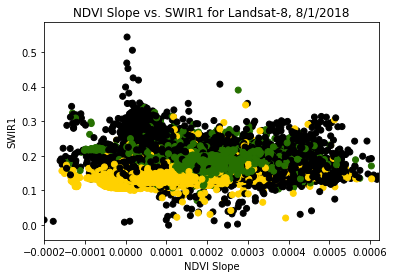

In [42]:
doy = np.where(np.array(l30_doys)==213)
plt.scatter(ndvi_slope[:400,:400], l30_tseries_by_band['swir1'][:400,:400,doy], c=np.reshape(cdl_img[:400,:400,:3].flatten(), [400*400,3]))
plt.xlim(ndvi_slope[:400,:400].min(), ndvi_slope[:400,:400].max())
plt.xlabel("NDVI Slope")
plt.ylabel("SWIR1")
plt.title("NDVI Slope vs. SWIR1 for Landsat-8, 8/1/2018")

It is possible that the linear separability using these features is dependent on the day of year (i.e., time during growing season). Below, we plot the scatter between these features for all days of the year in this data subset. Note that for some DOYs, there are no or very few data points due to the projection of the Landsat tile on the MGRS tile or due to cloud cover.

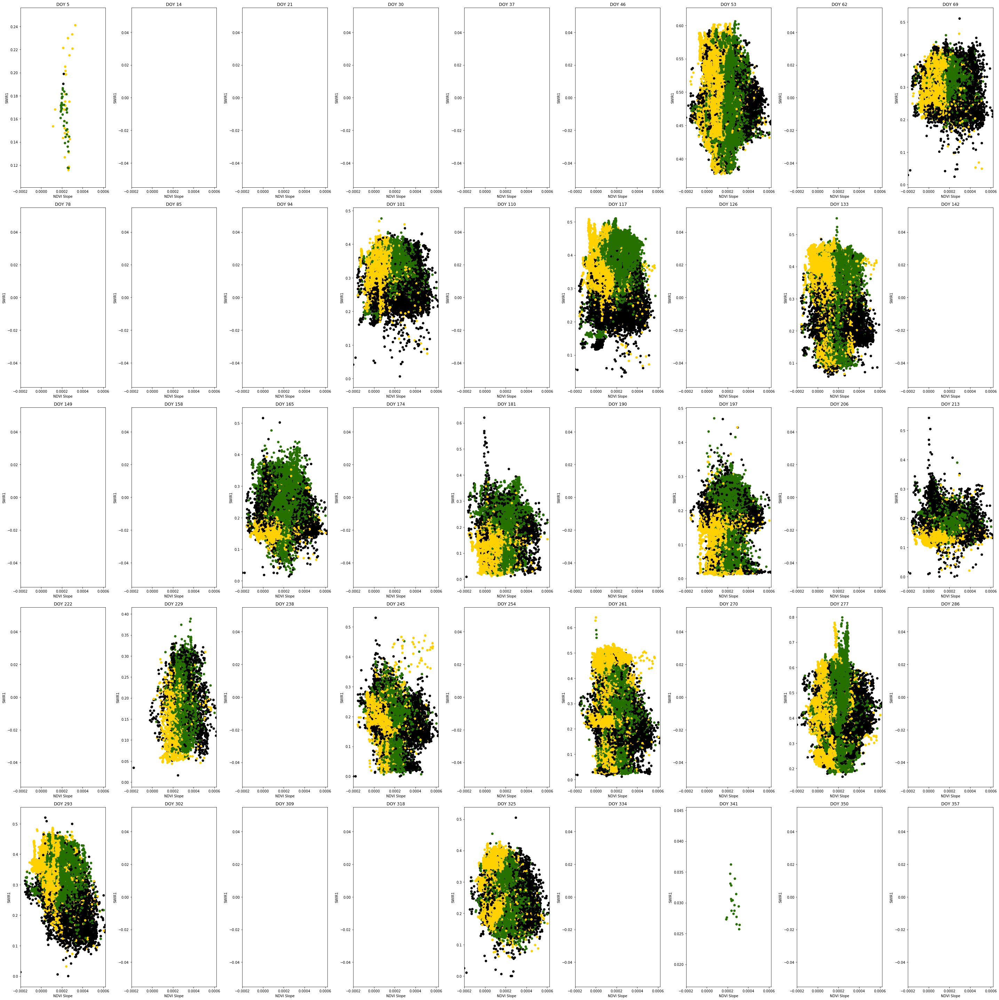

In [44]:
fig, ax = plt.subplots(nrows=5, ncols=9, figsize=[50,40])
for i, day in enumerate(l30_doys):
    doy = np.where(np.array(l30_doys)==day)
    ax[i/9,i%9].scatter(ndvi_slope[:400,:400], l30_tseries_by_band['swir1'][:400,:400,doy], c=np.reshape(cdl_img[:400,:400,:3].flatten(), [400*400,3]))
    ax[i/9,i%9].set_xlim(ndvi_slope[:400,:400].min(), ndvi_slope[:400,:400].max())
    ax[i/9,i%9].set_xlabel("NDVI Slope")
    ax[i/9,i%9].set_ylabel("SWIR1")
    ax[i/9,i%9].set_title("DOY %d" % day)
fig.tight_layout()

While some days seem to have better linear separability than others, it still doesn't look as clean as the plots shown in King et al., 2017. It's possible that this is due to the way we calculate NDVI slope, e.g., we use all days while they perhaps use some subset. It is also possible that the way they plotted them, i.e. as "heatmaps" or density maps rather than points that all have equal opacity, made them appear more linearly separable than they appear here.

### Load the Sentinel-2 time-series 
Next, we'll load all the S30 observations we have for each band separately for just our example MGRS tile (16SCJ), and do the same plots as those above.

In [46]:
# Path to the 2018 Sentinel-2 observations for 16SCJ
s30_path = '%s/16SCJ/S30/2018'

# Get the number of observations for that year
n_s30 = len(os.listdir(os.path.join(fp_illinois, s30_path % 'ndvi')))

# Get a list of the days of the year of each observation
s30_doys = []
for name in sorted(os.listdir(os.path.join(fp_illinois, s30_path % 'ndvi'))):
    s30_doys.append(int(name.split('.')[3][4:]))
    
print s30_doys

# Create a dictionary to hold time series cube for each band
s30_tseries_by_band = {}

# Iterate through each band directory
for b, band in enumerate(bands):
    if band in s30_tseries_by_band.keys():
        continue
    # Create an np.array to hold the t-band time-series (all tiles are 3660 x 3660)
    s30_tseries = np.ndarray([3660, 3660, n_s30])
    # Iterate through each observation
    for i, obs in enumerate(sorted(os.listdir(os.path.join(fp_illinois, s30_path % band)))):
        # Read/open the raster file
        obs_r = rasterio.open(os.path.join(fp_illinois, s30_path % band, obs))
        # Add this observation to the time series cube
        s30_tseries[:,:,i] = obs_r.read(1)
    s30_tseries_by_band[band] = s30_tseries
    
print s30_tseries_by_band.keys()

[1, 4, 9, 11, 14, 21, 24, 29, 31, 34, 36, 39, 41, 46, 49, 54, 56, 59, 66, 69, 71, 74, 81, 84, 86, 89, 91, 94, 96, 99, 101, 104, 106, 109, 111, 114, 121, 124, 126, 129, 131, 134, 136, 139, 141, 146, 149, 154, 156, 159, 161, 164, 166, 169, 171, 174, 176, 179, 181, 184, 186, 189, 191, 194, 196, 199, 201, 204, 206, 209, 214, 216, 219, 221, 224, 226, 229, 231, 234, 236, 239, 244, 246, 249, 251, 254, 256, 259, 261, 264, 266, 269, 271, 274, 276, 279, 281, 284, 286, 289, 291, 294, 296, 299, 301, 304, 309, 311, 314, 316, 319, 321, 324, 326, 329, 331, 334, 336, 339, 346, 349, 351, 354, 356, 359, 361, 364]
['blue', 'swir1', 'swir2', 'gcvi', 'green', 'ndvi', 'red']


In [47]:
print s30_tseries_by_band['ndvi'].shape

(3660, 3660, 127)


5
1
176
[0.00075928 0.09102289]


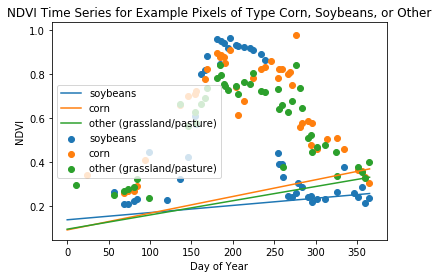

In [48]:
print cdl_labels[290,50]
print cdl_labels[25,100]
print cdl_labels[350,66]

nodata_inds = np.where(np.isnan(s30_tseries_by_band['ndvi']))
s30_tseries_by_band['ndvi'][nodata_inds] = 0

# Plot scatter - but I want these to be lines :(
plt.scatter(s30_doys, np.ma.masked_equal(s30_tseries_by_band['ndvi'][290,50], 0), label='soybeans')
plt.scatter(s30_doys, np.ma.masked_equal(s30_tseries_by_band['ndvi'][25,100], 0), label='corn')
plt.scatter(s30_doys, np.ma.masked_equal(s30_tseries_by_band['ndvi'][350,66], 0), label='other (grassland/pasture)')

# Plot linear regression lines
x = np.arange(0, 366)

fit_sbean = np.polyfit(s30_doys[5:-5], np.ma.masked_equal(s30_tseries_by_band['ndvi'][290,50,5:-5], 0), deg=1)
plt.plot(x, fit_sbean[0]*x + fit_sbean[1], label='soybeans')

fit_corn = np.polyfit(s30_doys[5:-5], np.ma.masked_equal(s30_tseries_by_band['ndvi'][25,100,5:-5], 0), deg=1)
plt.plot(x, fit_corn[0]*x + fit_corn[1], label='corn')
                                
fit_other = np.polyfit(s30_doys[5:-5], np.ma.masked_equal(s30_tseries_by_band['ndvi'][350,66,5:-5], 0), deg=1)
plt.plot(x, fit_other[0]*x + fit_other[1], label='other (grassland/pasture)')
                                
plt.xlabel("Day of Year")
plt.ylabel("NDVI")
plt.title("NDVI Time Series for Example Pixels of Type Corn, Soybeans, or Other")
plt.legend()

print fit_corn

# Is there another DOY range we should use when calculating 'seasonal slope'?

In [49]:
# Mask out all the NaN pixels
s30_tseries_by_band['ndvi'] = np.ma.masked_where(np.isnan(s30_tseries_by_band['ndvi']), s30_tseries_by_band['ndvi'])

In [50]:
# Make an nparray to hold the slopes
ndvi_slope = np.ndarray([s30_tseries_by_band['ndvi'].shape[0], s30_tseries_by_band['ndvi'].shape[1]])
# Go through each pixel and calculate the slope of the linear regression line 
for row in range(s30_tseries_by_band['ndvi'].shape[0]):
    fit = np.polynomial.polynomial.polyfit(x=s30_doys, y=s30_tseries_by_band['ndvi'][row].T, deg=1)
    ndvi_slope[row] = fit[1] # returned in reverse order from np.polyfit

# TODO: possibly restrict DOY to "season"? currently using all days available

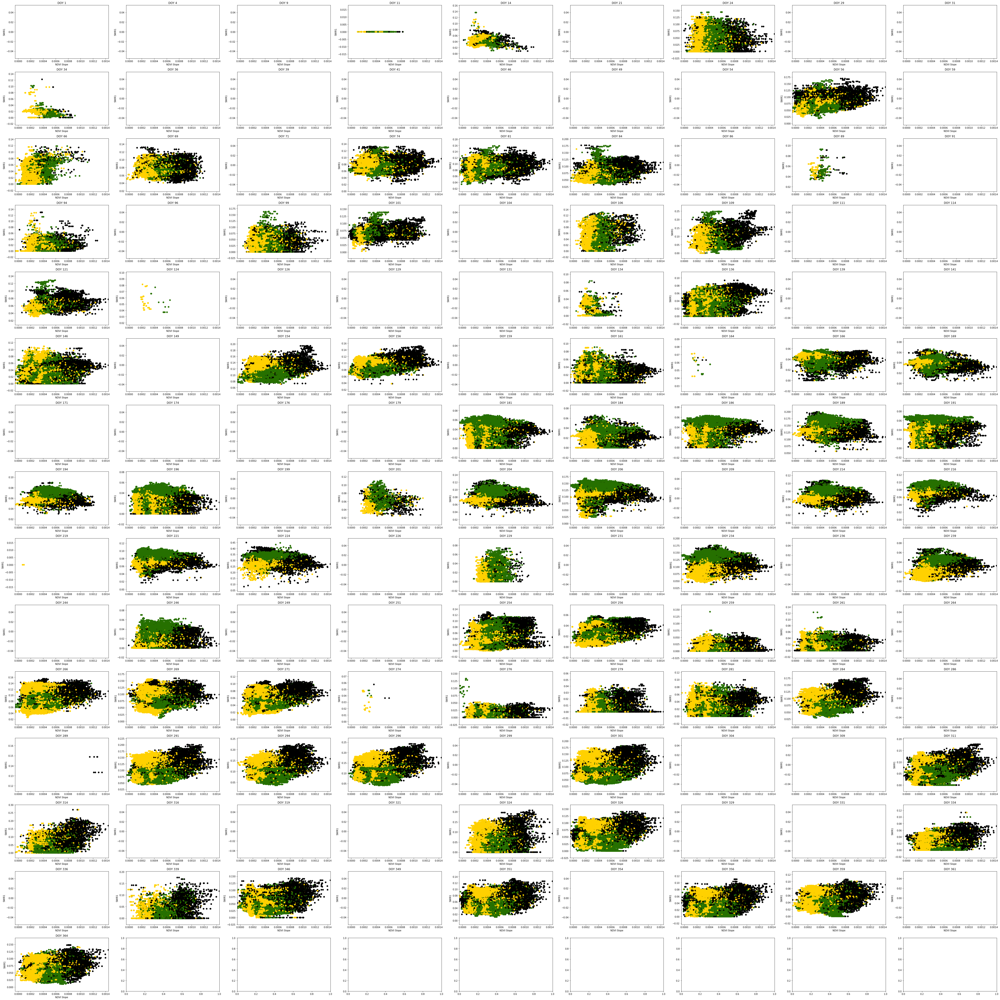

In [53]:
fig, ax = plt.subplots(nrows=15, ncols=9, figsize=[60,60])
for i, day in enumerate(s30_doys):
    doy = np.where(np.array(s30_doys)==day)
    ax[i/9,i%9].scatter(ndvi_slope[:400,:400], s30_tseries_by_band['swir1'][:400,:400,doy], c=np.reshape(cdl_img[:400,:400,:3].flatten(), [400*400,3]))
    ax[i/9,i%9].set_xlim(ndvi_slope[:400,:400].min(), ndvi_slope[:400,:400].max())
    ax[i/9,i%9].set_xlabel("NDVI Slope")
    ax[i/9,i%9].set_ylabel("SWIR1")
    ax[i/9,i%9].set_title("DOY %d" % day)
fig.tight_layout()